# Some important admin and homework for next time.


__Important point__. If you have not filled __[the mid-term survery ](https://forms.gle/wQMj2GV4XPFNJEuS7)__, please do! It's 100% anonymous. I promise it should not take more than 5 minutes. 


# Overview of today's class.

This week's curriculum is about text analysis. The overview is

* Finding the important words in a document (TF-IDF)
* Apply these tricks to understand what different communities in Computational Social Science are working on. 


> **Video lecture**: Simple methods reveal a lot. Sune talks a little bit about the paper: [Personality, Gender, and Age in the Language of Social Media: The Open-Vocabulary Approach](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0073791).  

In [161]:
YouTubeVideo("wkYvdfkVmlI",width=800, height=450)

NameError: name 'YouTubeVideo' is not defined

> __Exercise 1: TF-IDF and the Computational Social Science communities.__ The goal for this exercise is to find the words > charachterizing each of the communities of Computational Social Scientists.
> What you ned for this exercise: 
>    * The assignment of each author to their network community, and the degree of each author (Week 6, Exercise 4). This can be stored in a dataframe or in two dictionaries, as you prefer.  
>    * the tokenized _abstract_ dataframe (Week 7, Exercise 2)
>
> 1. First, check out [the wikipedia page for TF-IDF](https://en.wikipedia.org/wiki/Tf%E2%80%93idf). Explain in your own words the point of TF-IDF. 
>   * What does TF stand for? 
>   * What does IDF stand for?
> 2. Now, we want to find out which words are important for each *community*, so we're going to create several ***large documents, one for each community***. Each document includes all the tokens of abstracts written by members of a given community. 
>   * Consider a community _c_
>   * Find all the abstracts of papers written by a member of community _c_.
>   * Create a long array that stores all the abstract tokens 
>   * Repeat for all the communities. 
> __Note:__ Here, to ensure your code is efficient, you shall exploit ``pandas`` builtin functions, such as [``groupby.apply``](https://pandas.pydata.org/docs/reference/api/pandas.core.groupby.GroupBy.apply.html) or [``explode``](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.explode.html).
> 3. Now, we're ready to calculate the TF for each word. Use the method of your choice to find the top 5 terms within the __top 5 communities__ (by number of authors). 
>   * Describe similarities and differences between the communities.
>   * Why aren't the TFs not necessarily a good description of the communities?
>   * Next, we calculate IDF for every word. 
>   * What base logarithm did you use? Is that important?
> 4. We're ready to calculate TF-IDF. Do that for the __top 9 communities__ (by number of authors). Then for each community: 
>   * List the 10 top TF words 
>   * List the 10 top TF-IDF words
>   * List the top 3 authors (by degree)
>   * Are these 10 words more descriptive of the community? If yes, what is it about IDF that makes the words more informative?


In [1]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt

### Load the tokenized abstracts

In [2]:
df = pd.read_pickle("abstracts_tokenized.pickle")
df.head()

,paperId,abstract,authorIds,tokens,bigrams
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...","['50197963', '3371403', '2062143', '88738815']","[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer..."
1,cb3d482fa29075ed3305f11016056661c0d999e0,Preventing discrimination requires that we hav...,"['50197963', '3371403', '3171769', '2062143']","[preventing, discrimination, requires, means, ...","[(preventing, discrimination), (discrimination..."
2,e73859fdfb9c2986fa17fc8d7e596514487cdb8b,There are widespread concerns that the growing...,"['50197963', '3371403', '2062143', '88738815']","[there, widespread, concerns, growing, use, ma...","[(there, widespread), (widespread, concerns), ..."
3,59138f6c6cc957c03532088386cd15079c6d17af,The law forbids discrimination. But the ambigu...,"['50197963', '3371403', '3171769', '2062143']","[the, law, forbids, discrimination, but, ambig...","[(the, law), (law, forbids), (forbids, discrim..."
4,47c3d413056fe8538cb5ce2d6adc860e70062bf6,Evaluating whether machines improve on human p...,"['1892673', '1702139', '50197963', '3371403', ...","[evaluating, whether, machines, improve, human...","[(evaluating, whether), (whether, machines), (..."


### Load the communities and degrees

In [3]:
communities_df = pd.read_parquet("communities.parquet")

# Convert author to int
communities_df["author"] = communities_df["author"].astype(int)

communities_df.head()

,author,community,degree
0,1409288721,8,69
1,1844994,8,74
2,2064565683,8,69
3,1409160627,8,69
4,1409288763,8,69


### Explode the dataframe

In [4]:
# The authorIds have somehow become strings
# We need to convert them to lists
df["authorIds"] = df["authorIds"].apply(lambda x: eval(x))

df = df.explode("authorIds")

df["authorIds"] = df["authorIds"].astype(int)

df

,paperId,abstract,authorIds,tokens,bigrams
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...",50197963,"[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer..."
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...",3371403,"[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer..."
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...",2062143,"[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer..."
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...",88738815,"[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer..."
1,cb3d482fa29075ed3305f11016056661c0d999e0,Preventing discrimination requires that we hav...,50197963,"[preventing, discrimination, requires, means, ...","[(preventing, discrimination), (discrimination..."
...,...,...,...,...,...
894,c959b60afa302d960e3769996baf06448e708802,The integration of automotive communications i...,38738432,"[the, integration, automotive, communications,...","[(the, integration), (integration, automotive)..."
895,4f2ce2be2f01a724e68858d48f8d3ed99a638738,Significance Hierarchies structure the lives o...,22697386,"[significance, hierarchies, structure, lives, ...","[(significance, hierarchies), (hierarchies, st..."
895,4f2ce2be2f01a724e68858d48f8d3ed99a638738,Significance Hierarchies structure the lives o...,27750021,"[significance, hierarchies, structure, lives, ...","[(significance, hierarchies), (hierarchies, st..."
895,4f2ce2be2f01a724e68858d48f8d3ed99a638738,Significance Hierarchies structure the lives o...,8676192,"[significance, hierarchies, structure, lives, ...","[(significance, hierarchies), (hierarchies, st..."


### Add the community and degree to the dataframe

In [5]:
df = df.merge(communities_df, left_on="authorIds", right_on="author")

df.head()

,paperId,abstract,authorIds,tokens,bigrams,author,community,degree
0,167273526caeae8439b2c08630f984b758f76dab,"There is growing concern about ""algorithmic bi...",50197963,"[there, growing, concern, algorithmic, bias, p...","[(there, growing), (growing, concern), (concer...",50197963,8,7
1,cb3d482fa29075ed3305f11016056661c0d999e0,Preventing discrimination requires that we hav...,50197963,"[preventing, discrimination, requires, means, ...","[(preventing, discrimination), (discrimination...",50197963,8,7
2,e73859fdfb9c2986fa17fc8d7e596514487cdb8b,There are widespread concerns that the growing...,50197963,"[there, widespread, concerns, growing, use, ma...","[(there, widespread), (widespread, concerns), ...",50197963,8,7
3,59138f6c6cc957c03532088386cd15079c6d17af,The law forbids discrimination. But the ambigu...,50197963,"[the, law, forbids, discrimination, but, ambig...","[(the, law), (law, forbids), (forbids, discrim...",50197963,8,7
4,47c3d413056fe8538cb5ce2d6adc860e70062bf6,Evaluating whether machines improve on human p...,50197963,"[evaluating, whether, machines, improve, human...","[(evaluating, whether), (whether, machines), (...",50197963,8,7


### Calculate the community token arrays

In [6]:
# Group by community and get the concatenated token lists
community_tokens = df.groupby("community").apply(lambda x: x.drop_duplicates(subset=["paperId"])["tokens"].sum())
community_tokens_dict = {k: v for k, v in community_tokens.items()}

### Define the TF function

In [7]:
def tf(tokens):
    """Calculate the term frequency for a list of tokens"""
    tf_dict = {}
    for token in tokens:
        if token in tf_dict:
            tf_dict[token] += 1
        else:
            tf_dict[token] = 1
    return tf_dict

### Find the top 5 communities

In [8]:
top_communities = df.drop_duplicates("authorIds").groupby("community").count().sort_values("author", ascending=False).head(5).index

### Calculate the TF for the top 5 communities

In [9]:
D = {}

for community in top_communities:
    D[community] = tf(community_tokens_dict[community])

    print(f"Community {community}")
    print("TF")
    print(sorted(D[community].items(), key=lambda x: x[1], reverse=True)[:5])
    print()

Community 3
TF
[('we', 458), ('social', 336), ('data', 312), ('the', 265), ('model', 212)]

Community 8
TF
[('we', 206), ('social', 104), ('research', 90), ('the', 88), ('in', 87)]

Community 13
TF
[('data', 79), ('social', 66), ('the', 65), ('political', 51), ('news', 49)]

Community 84
TF
[('ray', 3), ('emission', 3), ('we', 3), ('optical', 3), ('blazar', 2)]

Community 5
TF
[('data', 73), ('social', 63), ('we', 50), ('media', 50), ('the', 46)]



You cans see that 4 out of 5 communities contain the word *social* in their top 5 TF words. This makes sense since this is an analysis on the Computational Social Science community. Moreover, four of the communities also have the words *the* and *we*. This is probably because the abstracts are written in English and the word *the* is the most common word in the English language. The word *we* is also very common in English and is used to refer to a group of people.

### Define the IDF function

In [10]:
def idf(D: dict):
    """Calculate the inverse document frequency for a list of tokens"""
    idf_dict = {}

    N = len(D)

    all_tokens = set([token for tokens in D.values() for token in tokens])

    for token in all_tokens:
        n = 0
        for tokens in D.values():
            if token in tokens:
                n += 1
        idf_dict[token] = np.log(N / n)

    return idf_dict

### Calculate the IDF for the top 5 communities

In [11]:
top5_idf = idf(D)

print("IDF")
print(sorted(top5_idf.items(), key=lambda x: x[1], reverse=True)[:5])

IDF
[('thresholds', 1.6094379124341003), ('debug', 1.6094379124341003), ('favorable', 1.6094379124341003), ('mix', 1.6094379124341003), ('lgas', 1.6094379124341003)]


### Define the TF-IDF function

In [12]:
def tf_idf(D: dict, idf: dict):
    """Calculate the TF-IDF for a list of tokens"""
    tf_idf_dict = {}

    for community, tokens in D.items():
        tf_idf_dict[community] = {}
        for token in tokens:
            tf_idf_dict[community][token] = tokens[token] * idf[token]

    return tf_idf_dict

### Calculate the TF-IDF for the top 9 communities

In [13]:
top9_communities = df.drop_duplicates("authorIds").groupby("community").count().sort_values("author", ascending=False).head(9).index

top9_D = {com_idx: tf(community_tokens_dict[com_idx]) for com_idx in top9_communities}
top9_idf = idf(top9_D)

top9_tf_idf = tf_idf(top9_D, top9_idf)

### Print the top 10 TF words, top 10 TF-IDF words and top 3 authors for each community

In [14]:
for community in top9_communities:
    print(f"Community {community}")
    print("TF")
    print(sorted(top9_D[community].items(), key=lambda x: x[1], reverse=True)[:10])
    print()
    print("TF-IDF")
    print(sorted(top9_tf_idf[community].items(), key=lambda x: x[1], reverse=True)[:10])
    print()
    print("Top 3 authors")
    print(df[df["community"] == community].groupby("author").count().sort_values("paperId", ascending=False).head(3).index)
    print()
    print()

Community 3
TF
[('we', 458), ('social', 336), ('data', 312), ('the', 265), ('model', 212), ('network', 204), ('in', 195), ('based', 181), ('networks', 162), ('study', 147)]

TF-IDF
[('social', 84.44164790238447), ('vaccination', 63.71951274275037), ('model', 53.278658795552104), ('influenza', 52.6427088871696), ('network', 51.26814336930486), ('traders', 48.33894070139683), ('trading', 46.14171612406061), ('epidemic', 46.14171612406061), ('mps', 46.14171612406061), ('interaction', 43.79023167568175)]

Top 3 authors
Int64Index([1768825, 143900982, 2349638], dtype='int64', name='author')


Community 8
TF
[('we', 206), ('social', 104), ('research', 90), ('the', 88), ('in', 87), ('data', 86), ('this', 79), ('show', 59), ('design', 59), ('use', 55)]

TF-IDF
[('auctions', 55.650863680722146), ('matching', 48.13047669684077), ('α', 43.94449154672439), ('mechanism', 35.680929513518464), ('games', 35.15559323737951), ('auction', 30.081547935525485), ('patients', 28.57747053874921), ('approximat

The words from TF-IDF are much more informative about the community than the TF values are. Each community is much more distinguishable in TF-IDF.

 __Exercise 2: The Wordcloud__. It's time to visualize our results!

> * Install the [`WordCloud`](https://pypi.org/project/wordcloud/) module. 
> * Now, create word-cloud for each community. Feel free to make it as fancy or non-fancy as you like.
> * Make sure that, together with the word cloud, you print the names of the top three authors in each community (see my plot above for inspiration). 
> * Comment on your results. What can you conclude on the different sub-communities in Computational Social Science? 
> * Look up online the top author in each community. In light of your search, do your results make sense?

Community 3


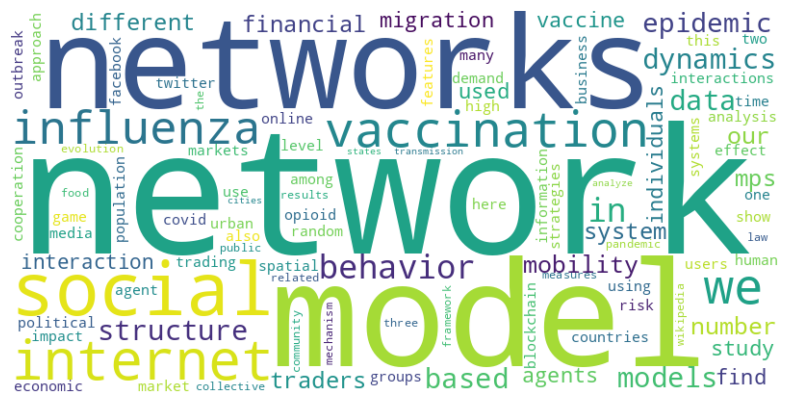

Community 8


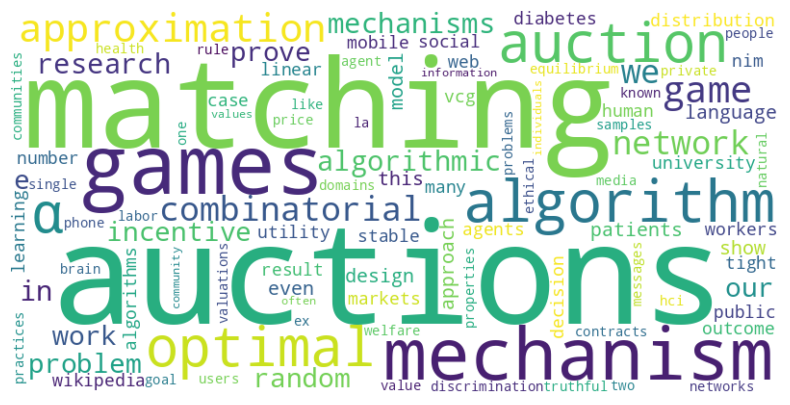

Community 13


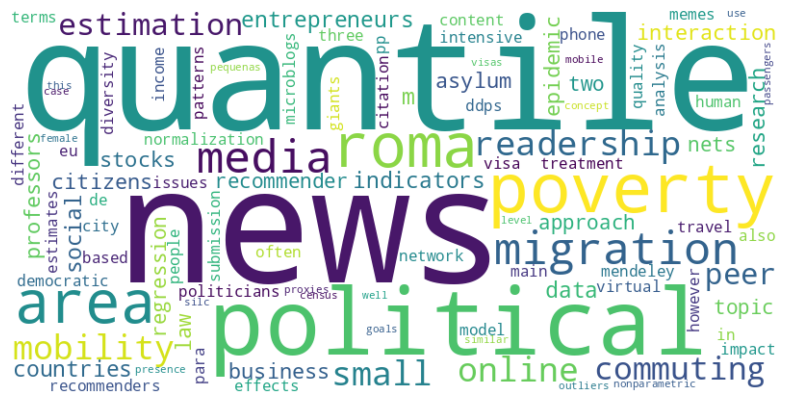

Community 84


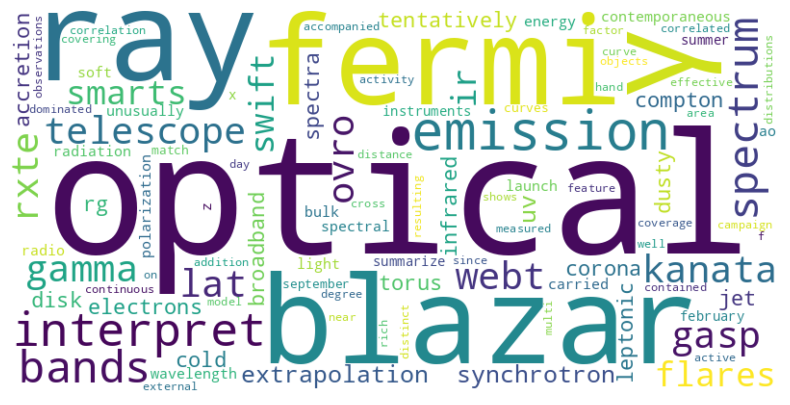

Community 5


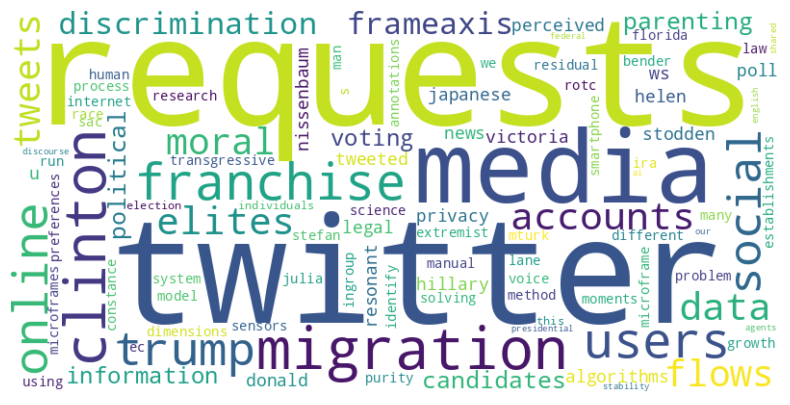

Community 25


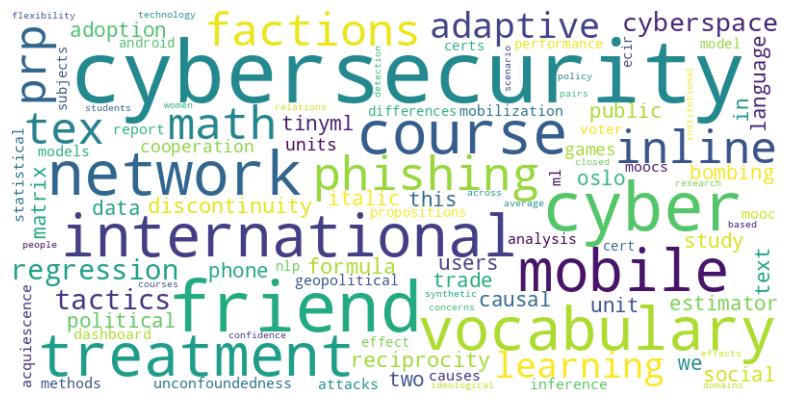

Community 2


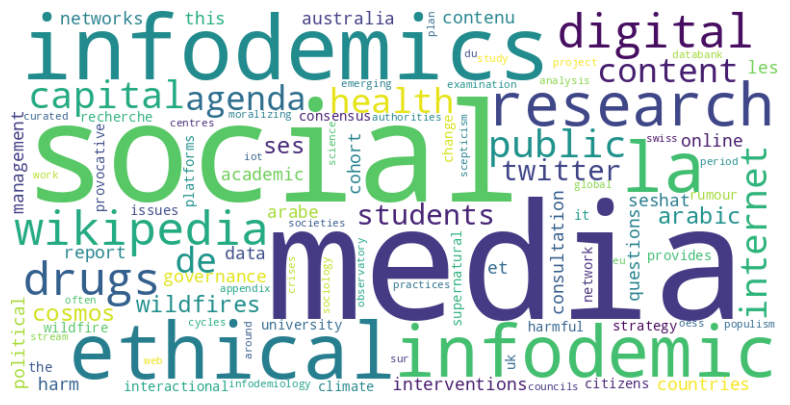

Community 21


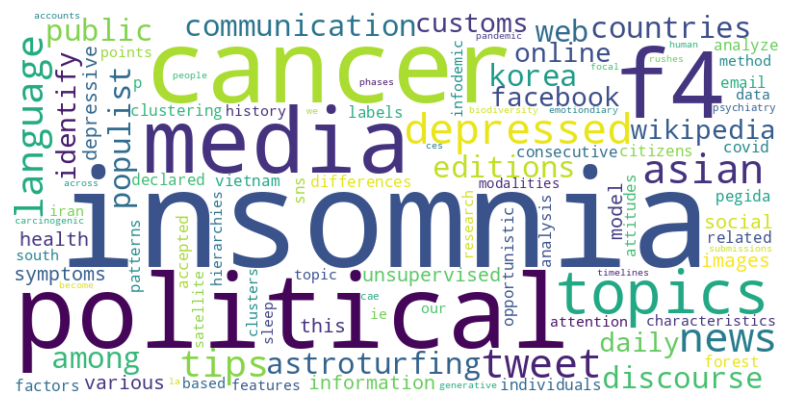

Community 76


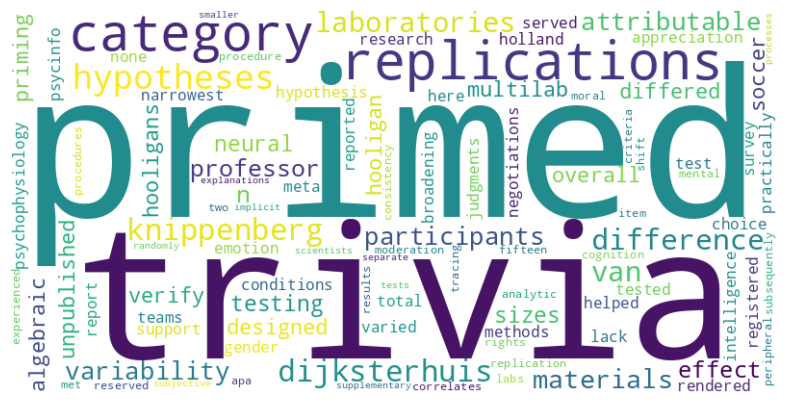

Community 23


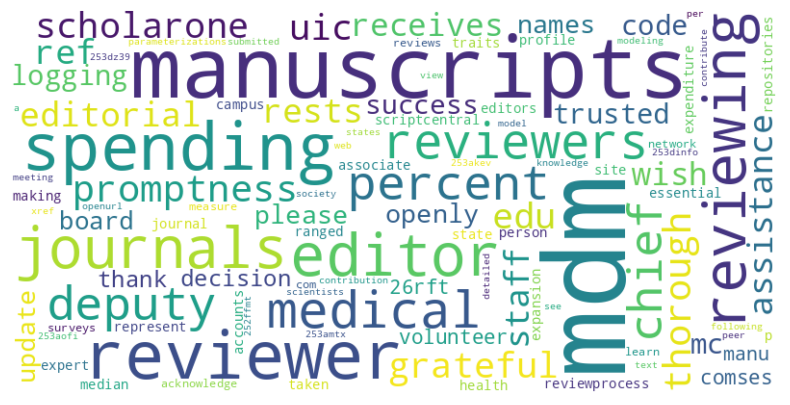

Community 4


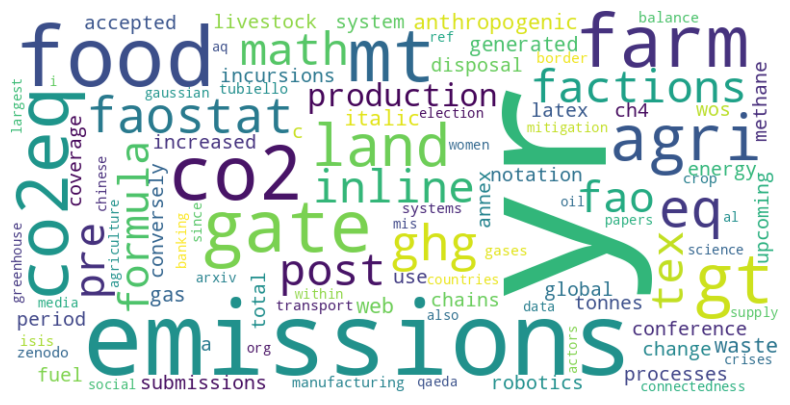

Community 11


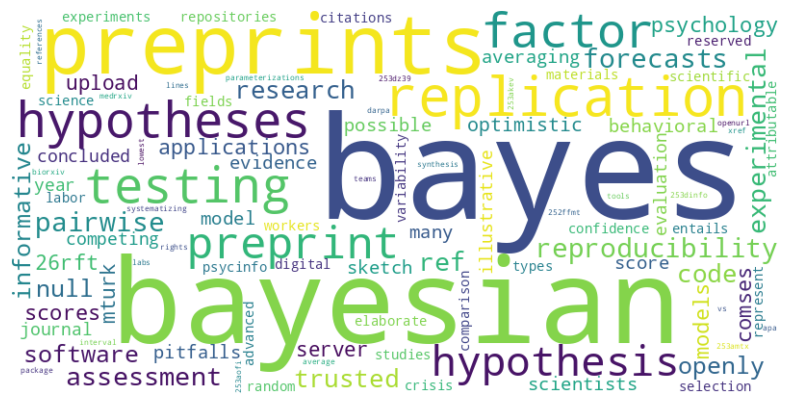

Community 1


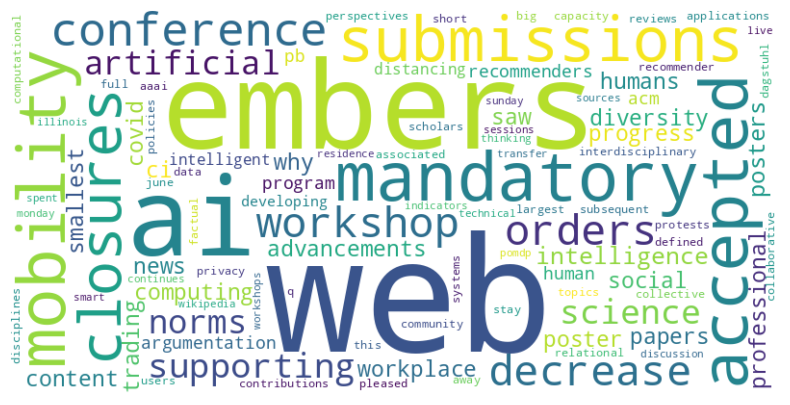

Community 24


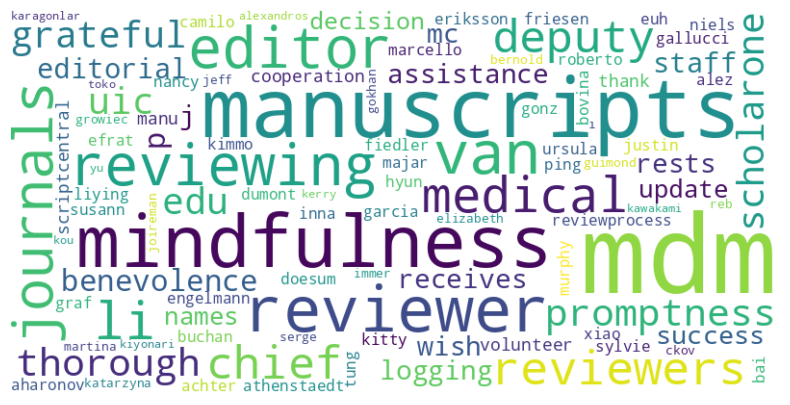

Community 15


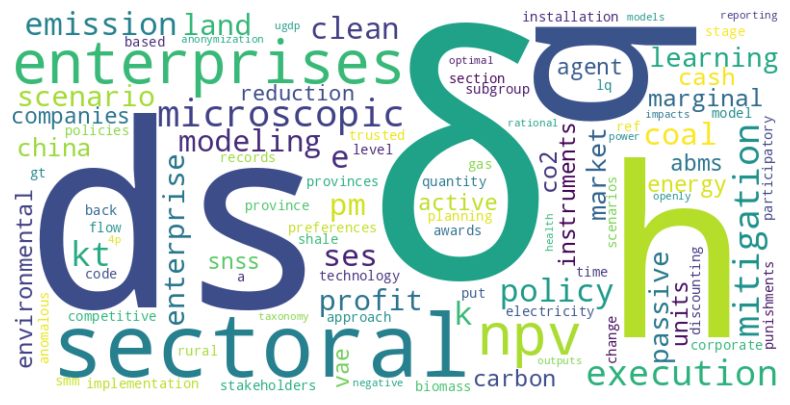

Community 27


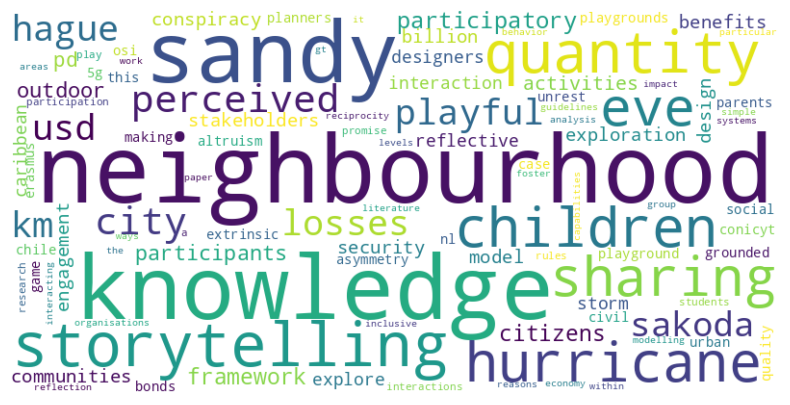

Community 19


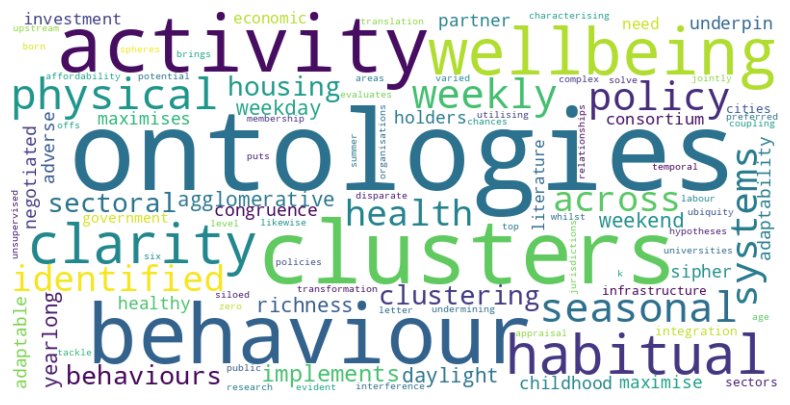

Community 18


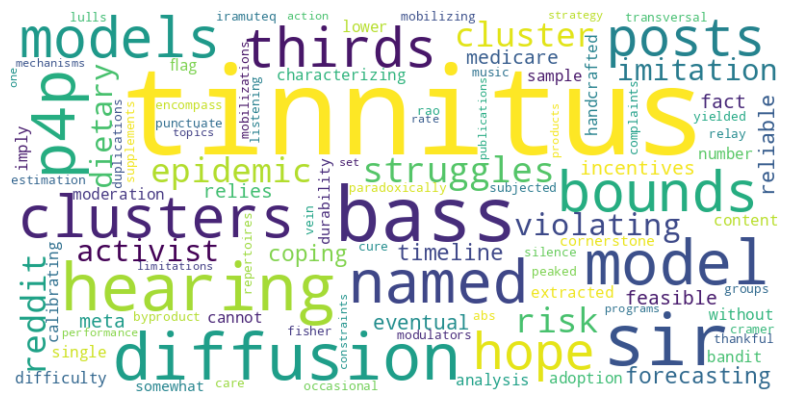

Community 57


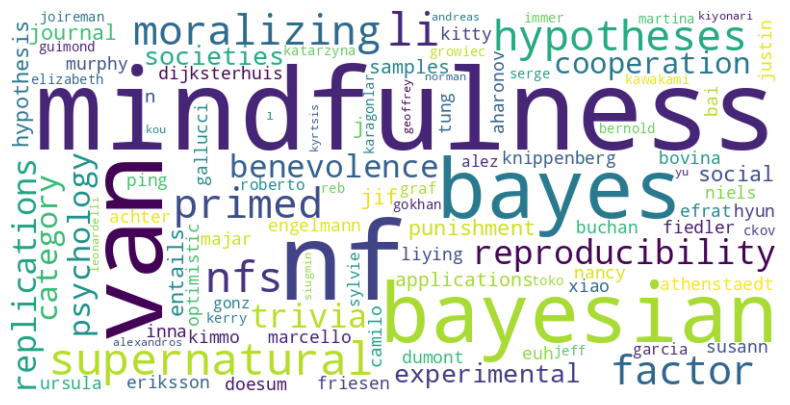

Community 26


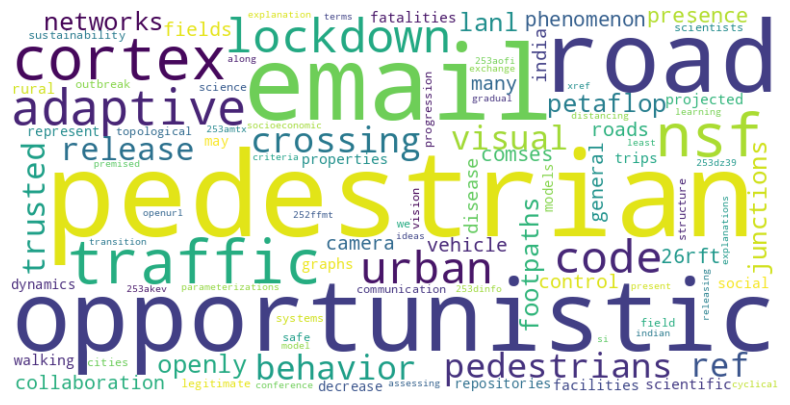

Community 182


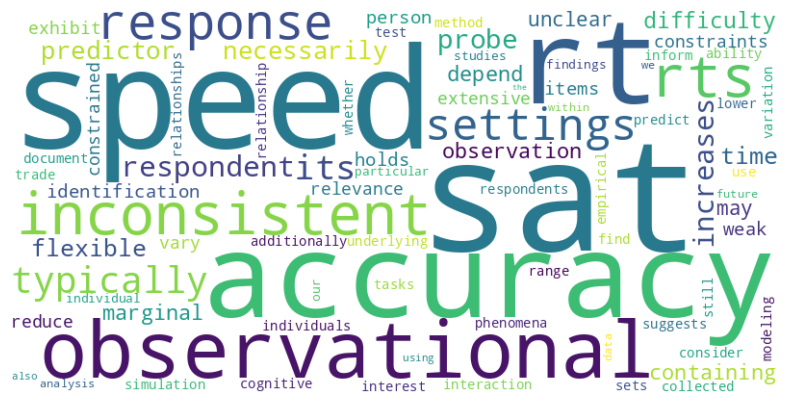

Community 31


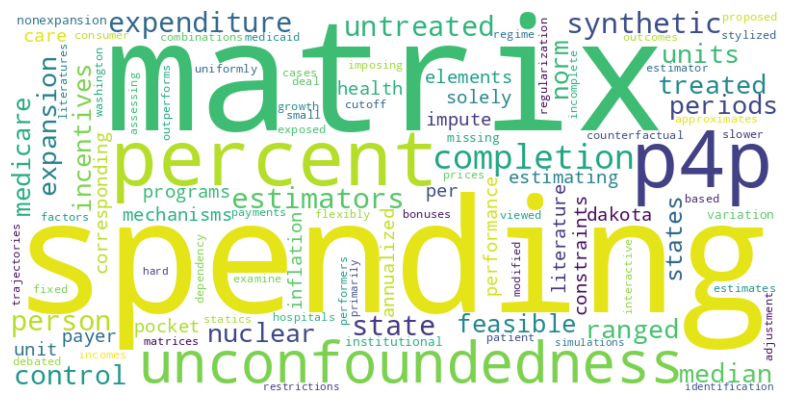

Community 14


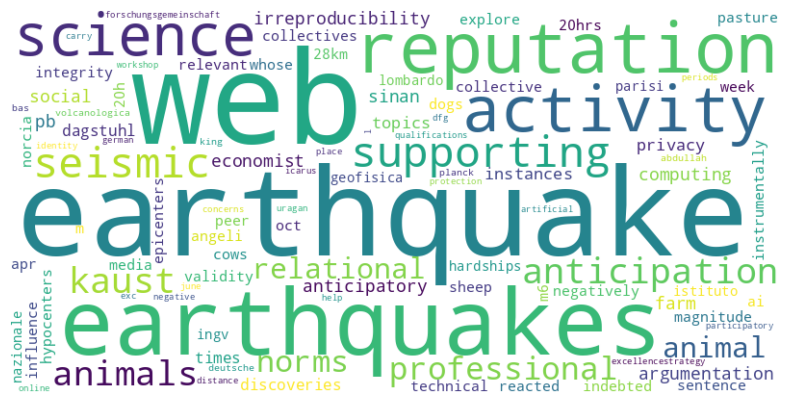

Community 138


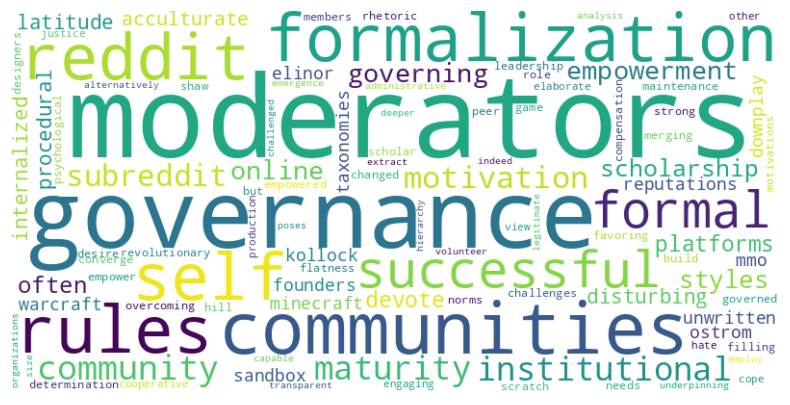

Community 136


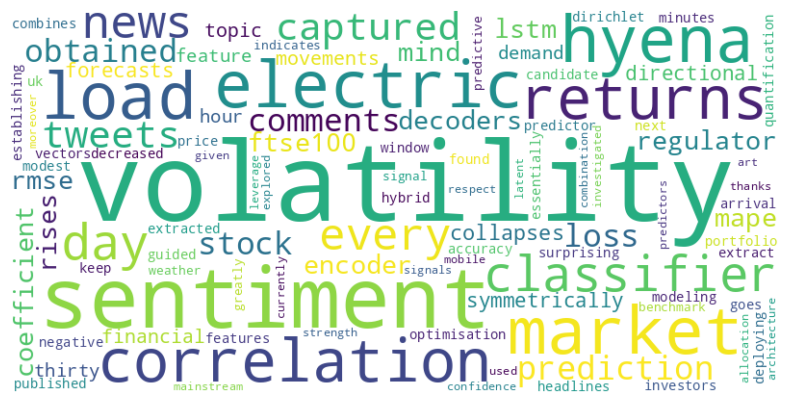

Community 129


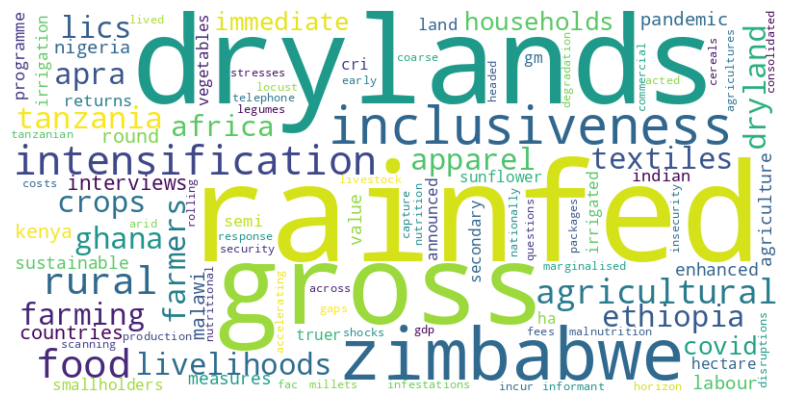

Community 61


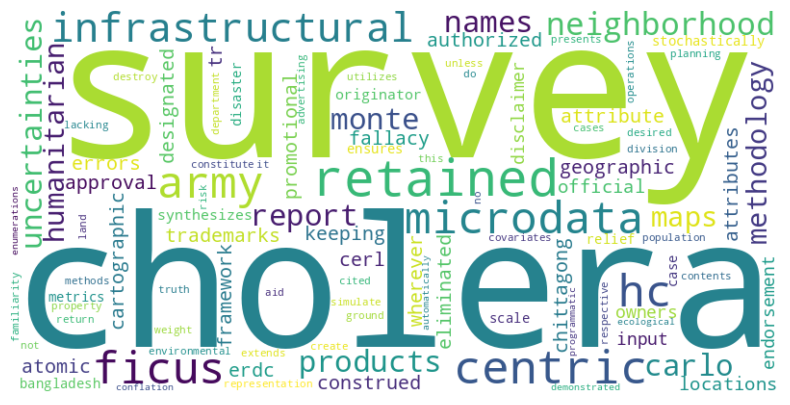

Community 194


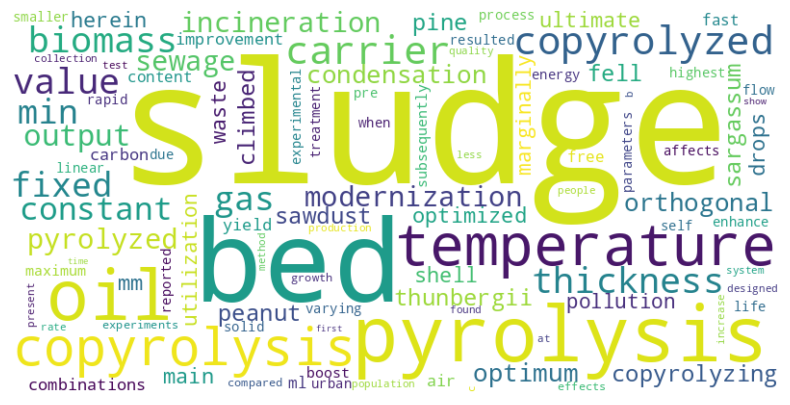

Community 156


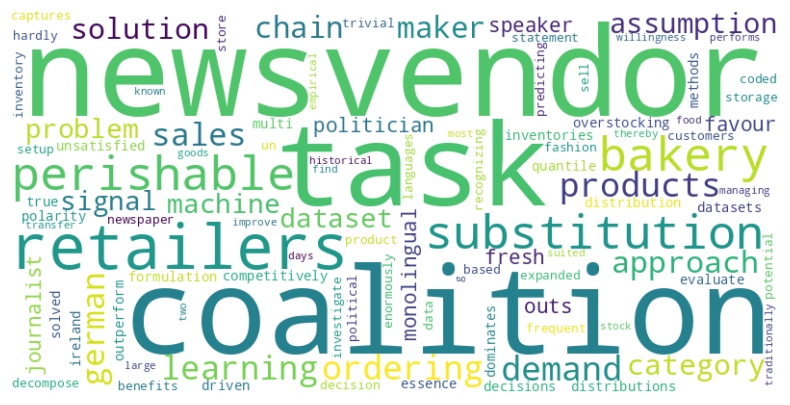

Community 205


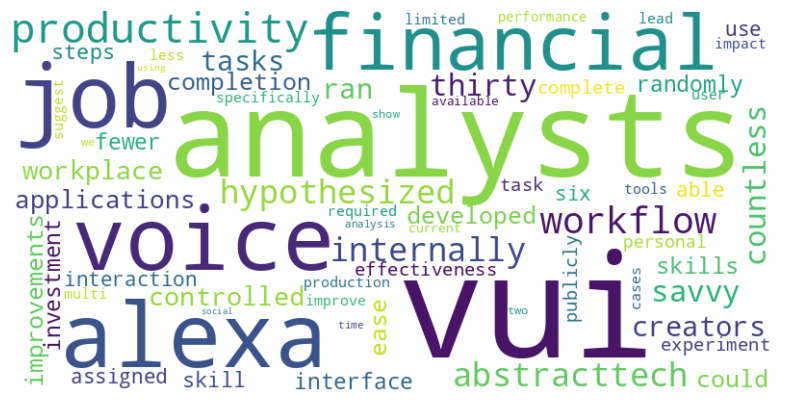

Community 81


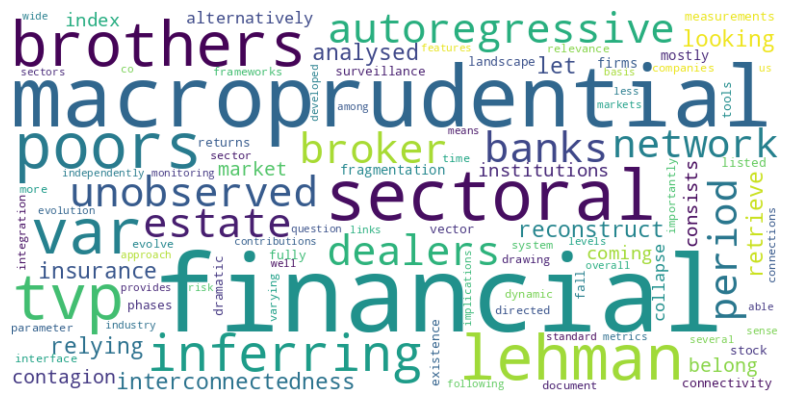

Community 68


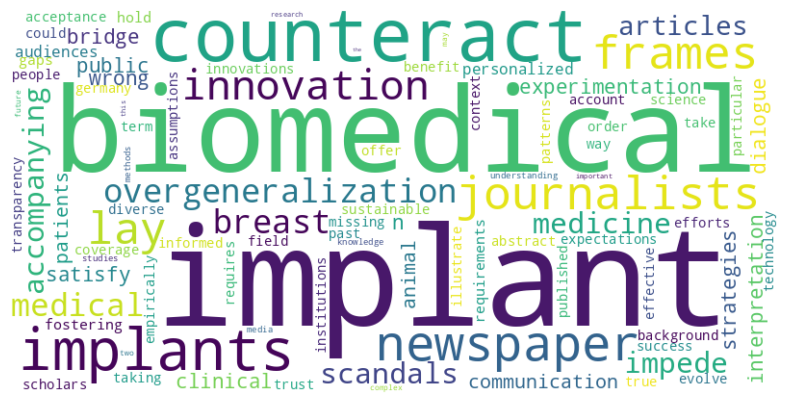

Community 55


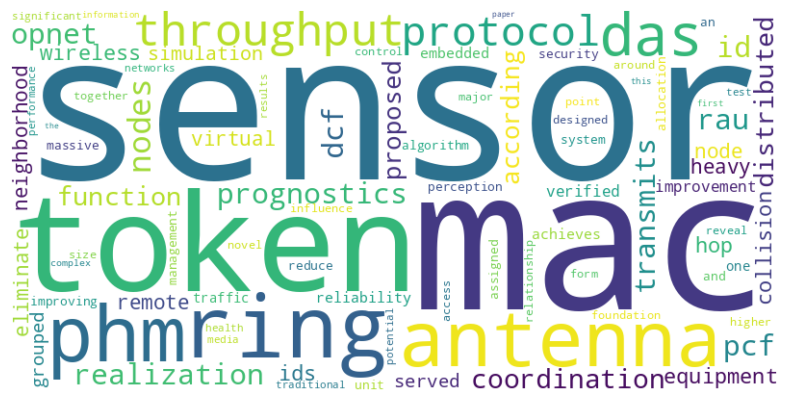

Community 44


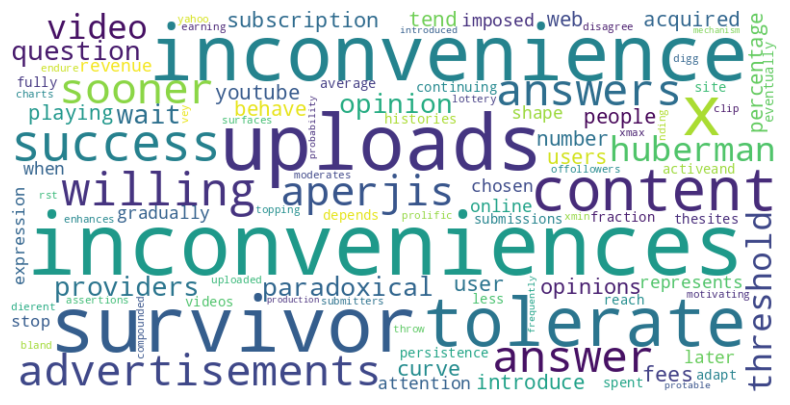

Community 58


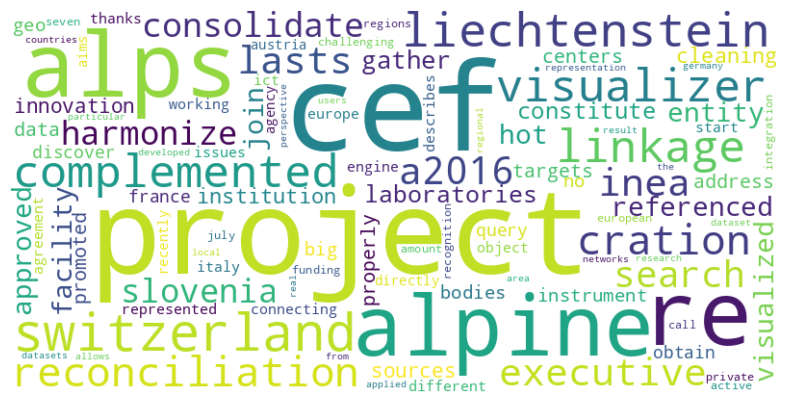

Community 175


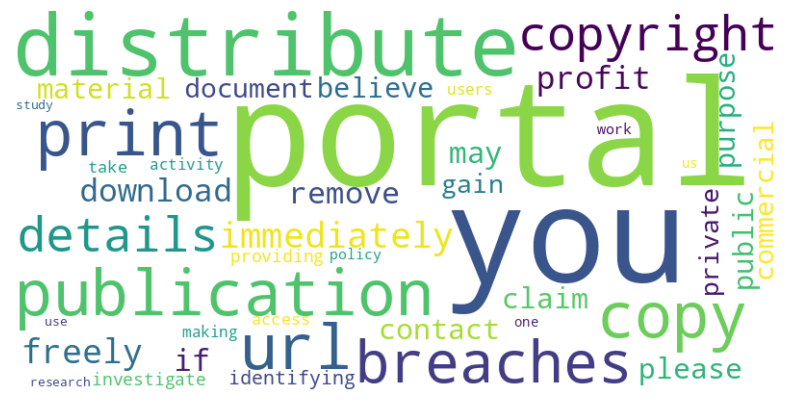

Community 64


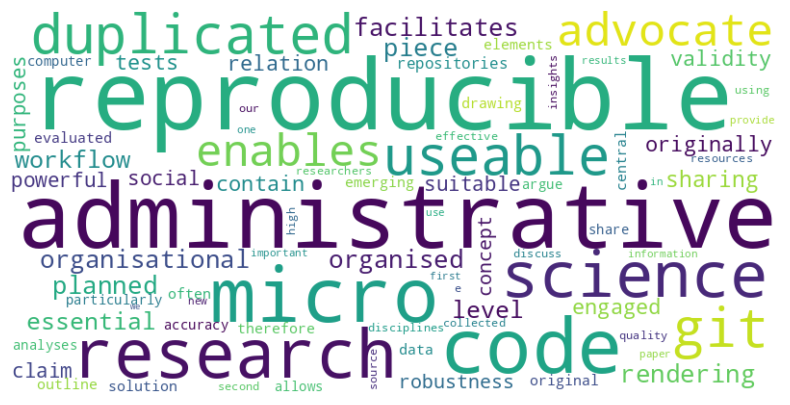

Community 219


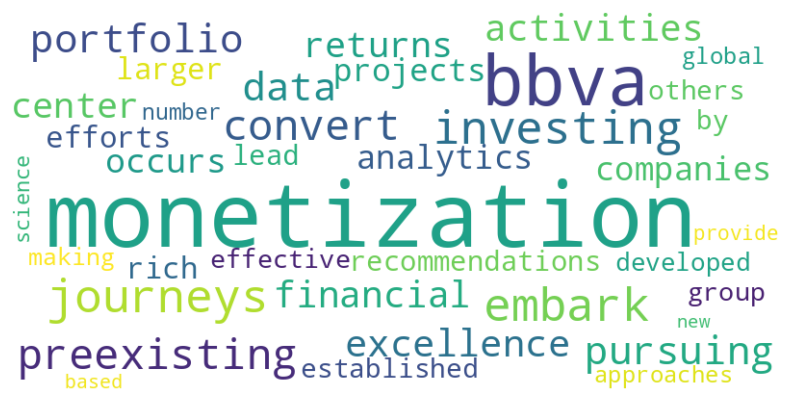

Community 170


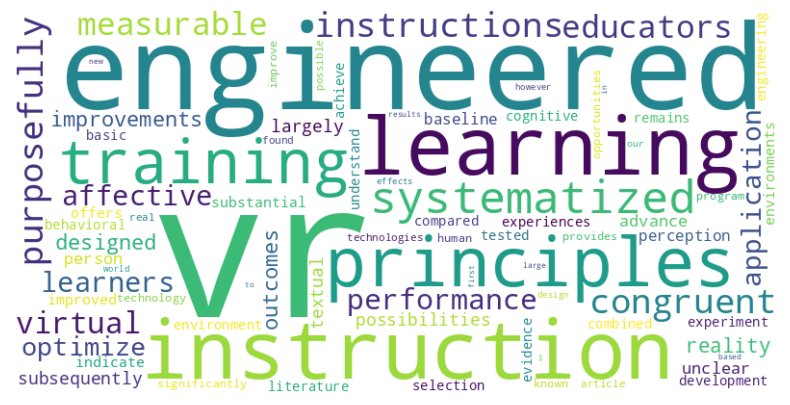

Community 164


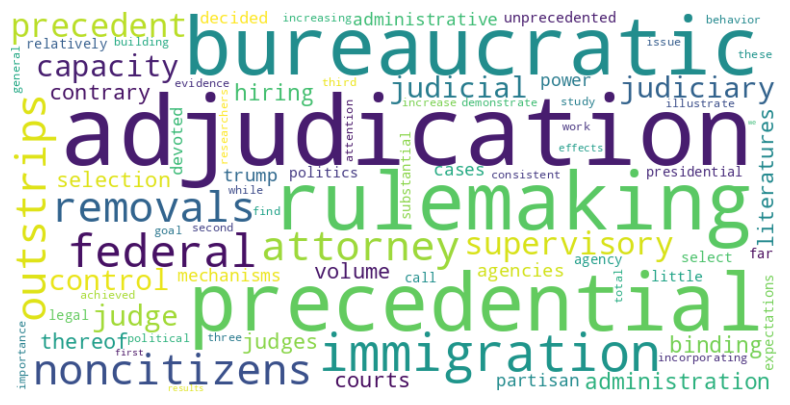

Community 88


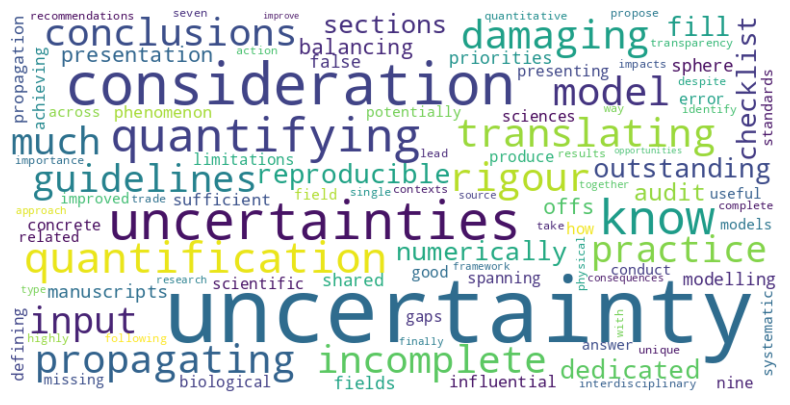

Community 22


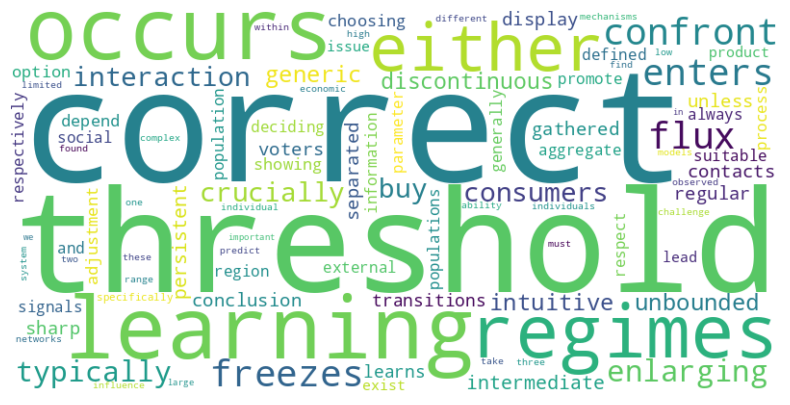

Community 54


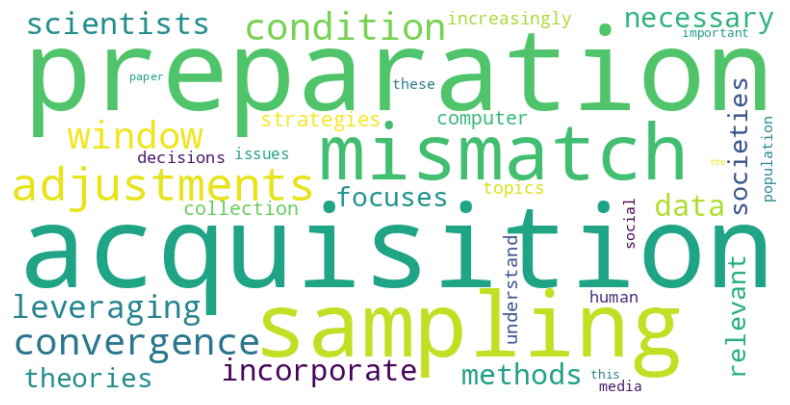

In [15]:
# Create wordcloud for each community
all_communities = df.drop_duplicates("authorIds").groupby("community").count().sort_values("author", ascending=False).index

D = {com_idx: tf(community_tokens_dict[com_idx]) for com_idx in all_communities}
idf_all = idf(D)
tf_idf_all = tf_idf(D, idf_all)

for community in all_communities:
    print(f"Community {community}")

    wordcloud = WordCloud(background_color="white", max_words=100, width=800, height=400).generate_from_frequencies(tf_idf_all[community])
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()